# Assignment 4
## Justin Law A12346613

### 1 - Bilateral filter

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import time
import imagetools.assignment4 as im

In [2]:
castle = 'assets/castle.png'
leopard = 'assets/leopard.png' 

### Q1)
####  load the image x = castle and add additive white Gaussian noise of standard deviation σ= 10/255

In [3]:
x = plt.imread(castle)
sig = 10 / 255
y   = x + sig * np.random.randn(*x.shape)

### Q2) 
#### imagetools/assignment4.py function
#### shown here for convenience, but implemented in imagetools/assignment4.py
```
def bilateral_naive(y, sig, s1=2, s2=2, h=1):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = max(alpha - 2 * h * variance,0)
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c)
        return math.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    for i in range(s1, n1-s1):
        for j in range(s2, n2-s2):
            tempx = tempz = 0
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = ((y[i + k, j + l] - y[i, j])**2).mean()
                    # complete
                    tempz += phi(dist2)
                    tempx += phi(dist2) * y[i + k, j + l]
            x[i,j] = tempx
            Z[i,j] = tempz
                    
    Z[Z == 0] = 1
    x = x / Z
    
    return x
```

### Helper functions for Q3,Q4,Q6

In [4]:
# helper function, modified for part 1
def plot4(*images,titles=None):
    # plot for images. Must give 4 title names and 4 images in the form of numpy arrays
    assert(len(titles)==len(images)==4)
    
    plt.figure()
    fig, axes = plt.subplots(ncols=4, figsize=(14, 7),sharex='all', sharey='all') 

    for i,image in enumerate(images):
        axes[i].set_title(titles[i],fontdict={'fontsize':15})
        im.show(image,ax=axes[i])

In [5]:
# helper functions for plotting 
def plot(x,y,naive,bilateral,t_naive_bilateral,t_bilateral,s2):
    # for plot4 see assignment4.py first function
    plot4(x,y,naive,bilateral,titles=['original','noisy','naive (s={1}) {0:.2f}s'.format(t_naive_bilateral,s2),'bilateral (s={1}) {0:.2f}s'.format(t_bilateral,s2)])

In [6]:
# helper function for comparing in Q5,Q6

factor = np.random.randn(*x.shape)
def compare(sig,s1,s2,h):   
    # keep the noisy image factor constant for consistency of comparisons

    y   = x + sig * factor
    
    init = time.time()
    naive = im.bilateral_naive(y=y,sig=sig,s1=s1,s2=s2,h=h)
    t_naive_bilateral = time.time() - init
    print('time for naive: {:.2f} seconds'.format(t_naive_bilateral))
    init = time.time()
    bilateral = im.bilateral(y=y,sig=sig,s1=s1,s2=s2,h=h)
    t_bilateral = time.time() - init
    print('time for bilateral: {:.2f} seconds'.format(t_bilateral))

    # see plot4 function, will plot all 4 at once
    plot(x,y,naive,bilateral,t_naive_bilateral,t_bilateral,s2)

### Q3)
#### test your function on y with s1=s2= 2 and h= 1
#### Note that this is similar to the compare function but naive bilateral has s1=s2=2 while bilateral has s1=s2=7 

time for naive: 45.99 seconds
time for bilateral: 4.22 seconds


<Figure size 432x288 with 0 Axes>

/usr/local/lib/miniconda3/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


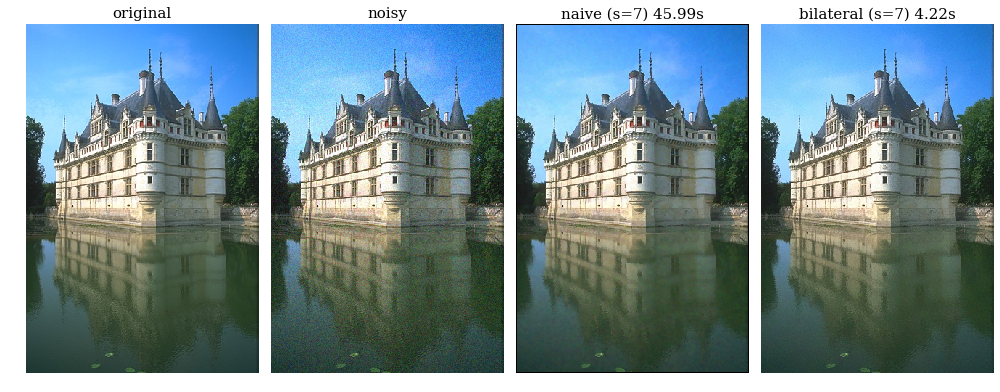

In [7]:
init = time.time()
naive = im.bilateral_naive(y=y,sig=sig,s1=2,s2=2,h=1)
t_naive_bilateral = time.time() - init
print('time for naive: {:.2f} seconds'.format(t_naive_bilateral))
init = time.time()
bilateral = im.bilateral(y=y,sig=sig,s1=7,s2=7,h=1)
t_bilateral = time.time() - init
print('time for bilateral: {:.2f} seconds'.format(t_bilateral))

# see plot4 function, will plot all 4 at once
plot(x,y,naive,bilateral,t_naive_bilateral,t_bilateral,7)

### Note: naive has s=2 above despite what the title says

#### Note that the naive bilateral lacks noise, and zooming in it is the same as (c)

### Q4)
#### bilateral was implemented in imagetools/assignment4.py
#### it is shown here for convenience
```
def bilateral(y, sig, s1=10, s2=10, h=1,boundary='periodical'):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = alpha
        num[(alpha - 2 * h * variance) < 0] = 0
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c)
        return np.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    for k in range(-s1, s1 + 1):
        for l in range(-s2, s2 + 1):
            shifted_y = shift(y, -k, -l, boundary)
            dist2 = np.square(shifted_y - y)
            if y.ndim==3:
                dist2 = dist2.mean(axis=y.ndim-1)
                x += np.repeat(phi(dist2)[:, :, np.newaxis], 3, axis=2) * shifted_y
                Z += phi(dist2)[:, :, np.newaxis]
            else:
                x += phi(dist2) * shifted_y
                Z += phi(dist2)
                    
    Z[Z == 0] = 1
    x = x / Z
    
    return x
```

### Q5) Compared as shown in Q3

time for naive: 46.44 seconds
time for bilateral: 0.48 seconds


<Figure size 432x288 with 0 Axes>

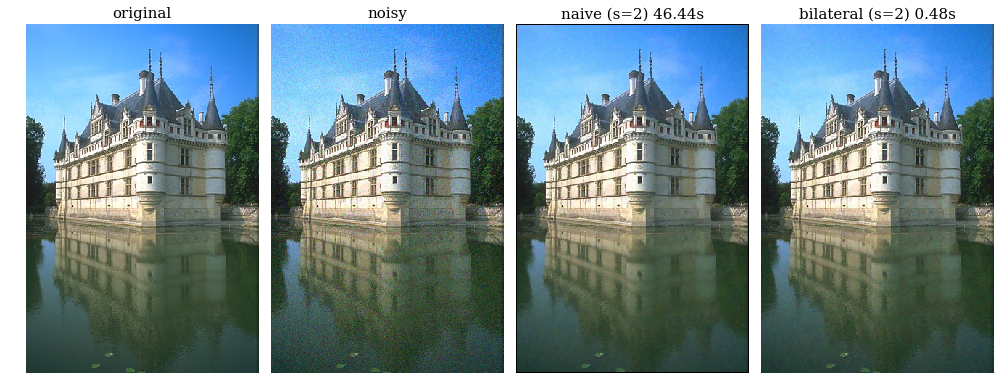

In [8]:
compare(sig,s1=2,s2=2,h=1)

### Q6)  

#### Increase seach window to s1=s2=7

time for naive: 366.70 seconds
time for bilateral: 4.19 seconds


<Figure size 432x288 with 0 Axes>

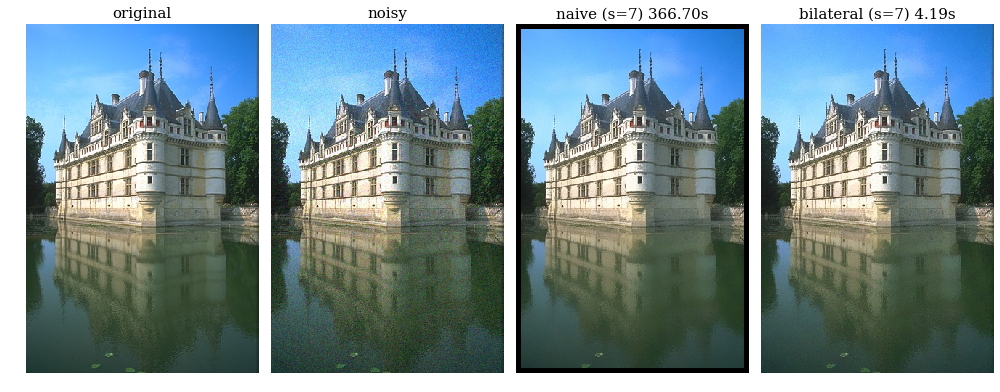

In [9]:
compare(sig,s1=7,s2=7,h=1)

### increase noise level (sigma). 

time for naive: 47.60 seconds
time for bilateral: 0.46 seconds


<Figure size 432x288 with 0 Axes>

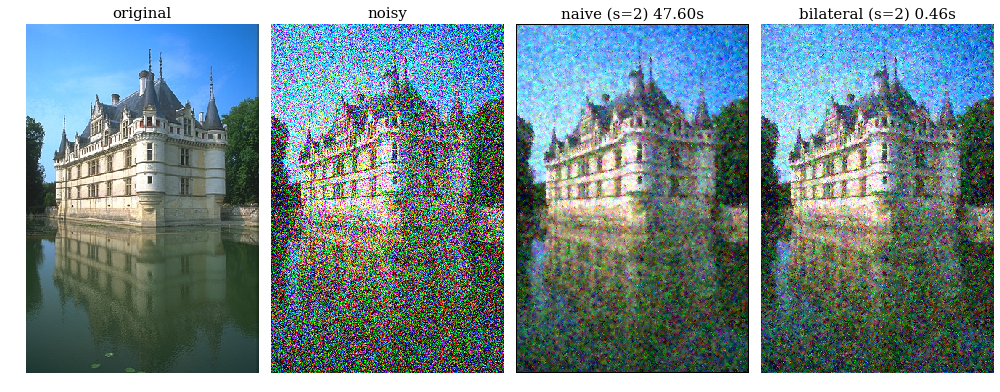

In [10]:
sig *= 10 # sig = 100 / 250
compare(sig,s1=2,s2=2,h=1)

#### Increase seach window to s1=s2=7 and increase noise level (sigma)

time for naive: 360.13 seconds
time for bilateral: 4.17 seconds


<Figure size 432x288 with 0 Axes>

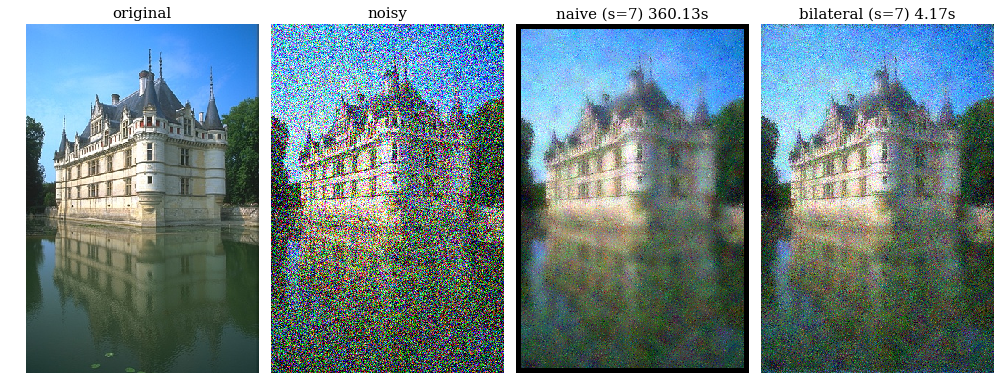

In [11]:
compare(sig,s1=7,s2=7,h=1)

#### Observations:
- Increasing the search window to 7 increases the runtime by a factor of 7-8x,regardless of sigma
- Sigma can be increased to the point where the image is not recoverable
- Sigma does not increase runtime

## 2 NL-means filter

### Q7)

#### imagetools/assignment4.py function
#### shown here for convenience, but implemented in imagetools/assignment4.py
```
def nlmeans_naive(y, sig, s1=2, s2=2, p1=1, p2=1, h=1):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    p = (2*p1 + 1)*(2*p2+1)

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = max(alpha - 2 * h * variance,0)
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c*p)
        return math.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))

    for i in range(s1, n1-s1-p1):
        for j in range(s2, n2-s2-p2):
            tempx = tempz = 0
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = 0
                    for u in range(-p1, p1 + 1):
                        for v in range(-p2, p2 + 1):
                            # complete
                            dist2 += ((y[i + k + u, j + l + v] - y[i + u, j + v])**2).mean()
                    tempz += phi(dist2)
                    tempx += phi(dist2) * y[i + k, j + l]
            x[i,j] = tempx
            Z[i,j] = tempz
            
    Z[Z == 0] = 1
    x = x / Z
    
    return x
```

### Q8)

### load image and add noise

In [35]:
x = plt.imread(leopard)
sig = 20/255
y = x + sig * np.random.randn(*x.shape)

### original image (noisy) for reference

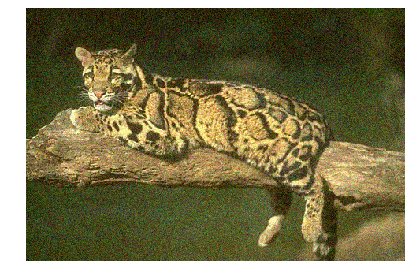

In [36]:
plt.figure()
im.show(y)

### test function on RGB

In [50]:
s1 = s2 = 2
p1 = p2 = 1

init = time.time()
nlm_naive = im.nlmeans_naive(y, sig, s1=s1, s2=s2, p1=p1, p2=p2)
time_naive_nlm = time.time() - init
print(time_naive_nlm,'s')

271.050235748291 s


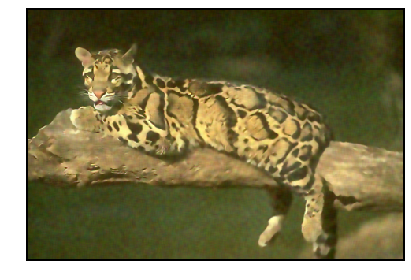

In [52]:
im.show(nlm_naive)

### test function on greyscale

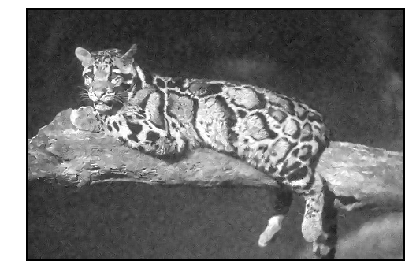

In [53]:
nlm_naive2 = im.nlmeans_naive(y[:,:,0], sig)
plt.figure()
im.show(nlm_naive2)

### Q9) psnr function


In [16]:
def psnr(x,x0):
    import math
    
    # if something is a bit over 1 or less than 0
    test_nlm = np.round(x)

    # used any for faster checking
    if not ((test_nlm>1).any() or (test_nlm<0).any()):
        Rsquared = 1
    elif not ((test_nlm>255).any() or (test_nlm<0).any()):
        Rsquared = 255
    else:
        raise TypeError('not an image')

    def l2normsquared(z):
        if len(z.shape)==3:
            temp = (z**2).mean(axis=2)
        else:
            temp = z**2
        
        return np.sum(temp)
    
    n = x.size
    
    return 10*math.log10((n*Rsquared) / l2normsquared(x-x0))

### Q10)
#### Test the nlmeans function just as in Q7

### On RGB images, it is around 500 times faster than the naive implementation. Because my shift function is slow it is not as fast is it could be.

### test function on RGB

1.83 s


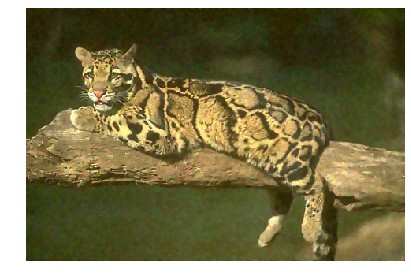

In [17]:
s1 = s2 = 2
p1 = p2 = 1

init = time.time()
nlm = im.nlmeans(y, sig, s1=s1, s2=s2, p1=p1, p2=p2)
time_nlmq10 = time.time() - init
print(round(time_nlmq10,2),'s')
im.show(nlm)

### test function on greyscale

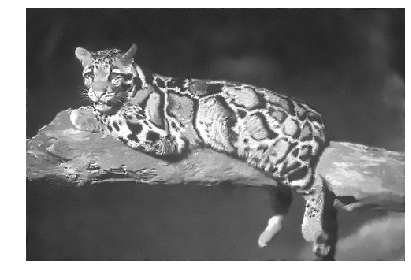

In [18]:
nlm2 = im.nlmeans(y[:,:,0], sig)
plt.figure()
im.show(nlm2)

### Q11)
#### Complexity of nlmeans_naive is O((2s1 + 1)(2s2+1)(2p1+1)(2p2+1)) = O(s1s2p1p2)

#### Complexity of nlmeans is O((2s1 + 1)(2s2+1)) = O(s1s2)

### Q12)
#### imagetools/assignment4.py function
#### shown here for convenience, but implemented in imagetools/assignment4.py

```
def psnr(x,x0):
    import math
    
    # if something is a bit over 1 or less than 0
    test_nlm = np.round(nlm)

    # used any for faster checking
    if not ((test_nlm>1).any() or (test_nlm<0).any()):
        Rsquared = 1
    elif not ((test_nlm>255).any() or (test_nlm<0).any()):
        Rsquared = 255
    else:
        raise TypeError('not an image')

    def l2normsquared(z):
        if len(z.shape)==3:
            temp = (z**2).mean(axis=2)
        else:
            temp = z**2
        
        return np.sum(temp)
    
    n = x.size
    
    return 10*math.log10((n*Rsquared) / l2normsquared(x-x0))
```

### Q13) See figure
#### Note:I only have a periodical filter which is why the dB seems low

In [19]:
# helper function
import math
def plot4(*images,titles=None):
    # plot for images. Must give 4 title names and 4 images in the form of numpy arrays
    assert(len(titles)==len(images)==4)
    
    plt.figure()
    fig, axes = plt.subplots(nrows=2,ncols=2,figsize=(14, 7),sharex='all', sharey='all') 
    fig.set_tight_layout(False)
    
    for i,image in enumerate(images):
        j = math.floor(i / 2)
        ii = i % 2
        axes[j,ii].set_title(titles[i])
        im.show(image,ax=axes[j,ii])

In [20]:
def plot(x,y,bilateral,NLM,time_bilateral,time_nlm,s1,s2,h):
    # for plot4 see assignment4.py first function
    plot4(x,y,bilateral,NLM,titles=['original','noisy','bilateral (s1=s2={0}) {1:2f}dB {2:2f}s h={3}'.format(s1,psnr(bilateral,x), time_bilateral,h),'NLM (s1=s2={0}) {1:2f}dB {2:2f}s'.format(s2,psnr(NLM,x),time_nlm,h)])

In [21]:
factor = np.random.randn(*x.shape)
def compare_bilateral_nlm(sig,s1,s2,p1,p2,h):

    y   = x + sig * factor
    # bilateral
    init = time.time()
    bilateral = im.bilateral(y=y,sig=sig,s1=s1,s2=s2,h=h)
    time_bilateral = time.time() - init
    print('time for bilateral: {:.2f} seconds'.format(time_bilateral))

    # nlm

    init = time.time()
    NLM = im.nlmeans(y, sig, s1=s1, s2=s2, p1=p1, p2=p2)
    time_nlm = time.time() - init
    print('time for nlm: ' + str(round(time_nlm,2)) +'s')
    plot(x,y,bilateral,NLM,time_bilateral,time_nlm,s1,s2,h)

time for bilateral: 4.23 seconds
time for nlm: 16.8s


<Figure size 432x288 with 0 Axes>

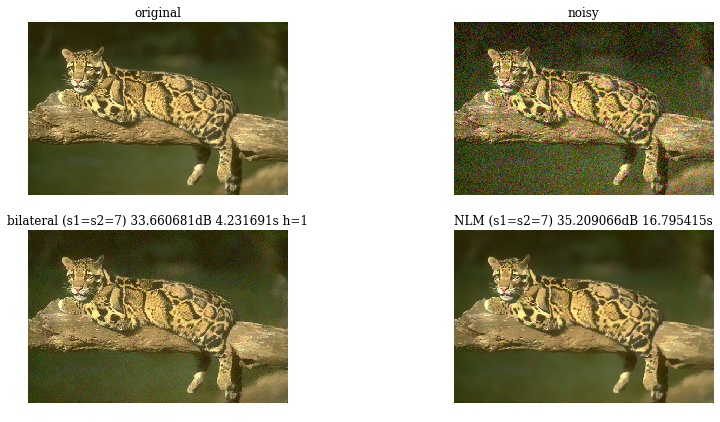

In [22]:
sig = 20 / 255

compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=1)

### Q14) Try different h and compare the results
#### Results: I tried for h=5,25,100,-5,1.5,2. h does not change the time complexity but from expermentation it seems that the optimal h is somewhere in the range h=1.5 to h=2.5. h=1.5 and h=2 gives around 34.5 dB and is faster than the nlm implementation.
#### Note: All shift operations use a periodical filter

#### h=1 for nlm, I just wanted to look at bilateral for reference

time for bilateral: 3.52 seconds
time for nlm: 16.29s


<Figure size 432x288 with 0 Axes>

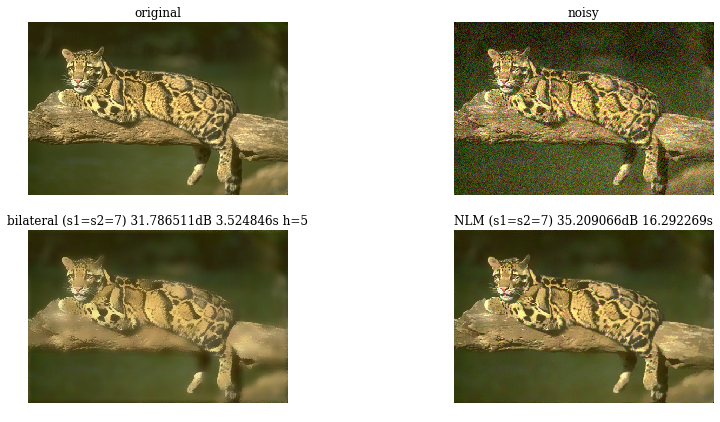

In [23]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=5)

time for bilateral: 3.29 seconds
time for nlm: 16.3s


<Figure size 432x288 with 0 Axes>

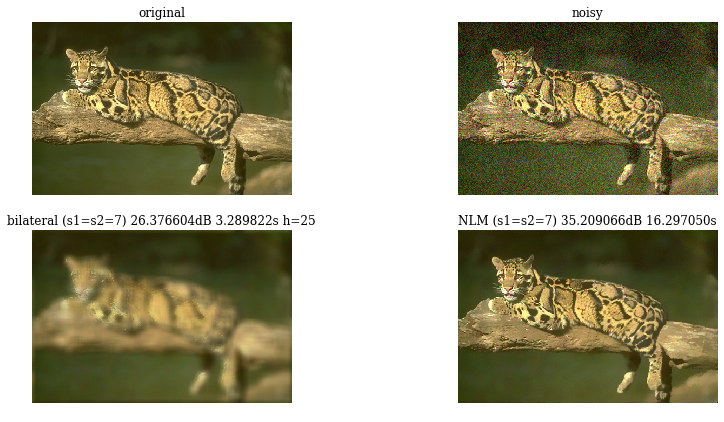

In [24]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=25)

time for bilateral: 3.82 seconds
time for nlm: 16.22s


<Figure size 432x288 with 0 Axes>

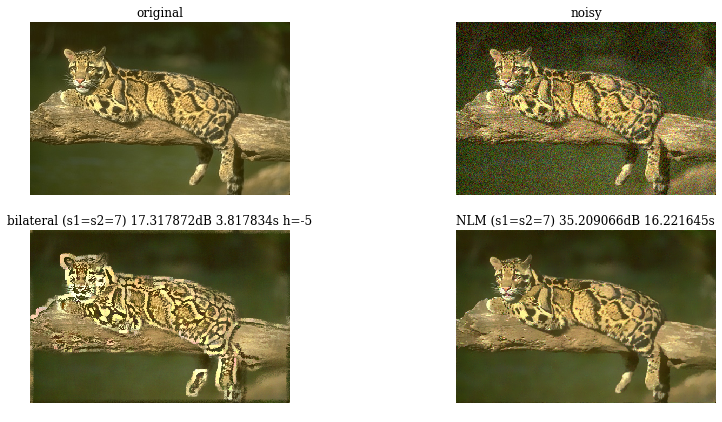

In [26]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=-5)

time for bilateral: 4.03 seconds
time for nlm: 16.58s


<Figure size 432x288 with 0 Axes>

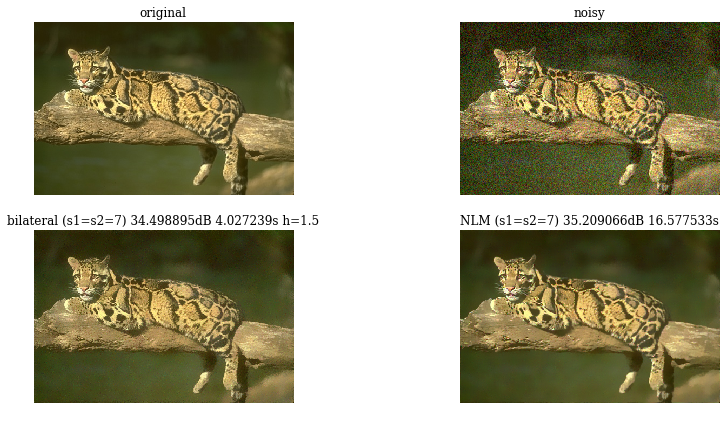

In [30]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=1.5)

time for bilateral: 4.10 seconds
time for nlm: 16.84s


<Figure size 432x288 with 0 Axes>

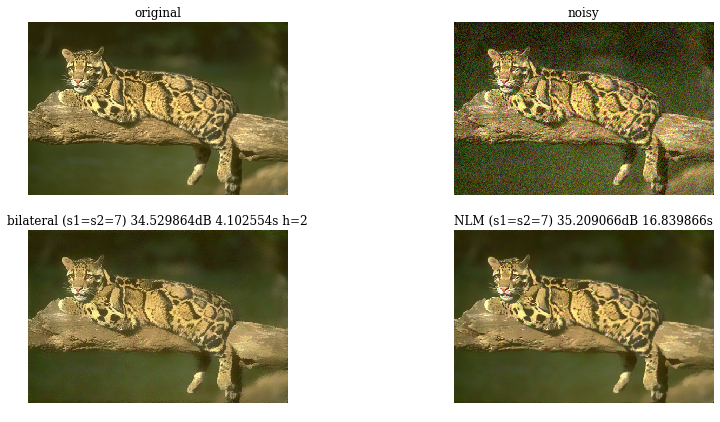

In [31]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=2)

time for bilateral: 3.82 seconds
time for nlm: 16.73s


<Figure size 432x288 with 0 Axes>

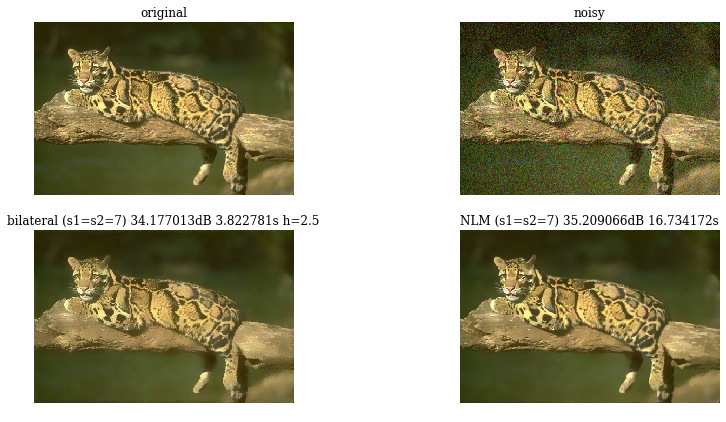

In [33]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=2.5)

time for bilateral: 3.80 seconds
time for nlm: 16.57s


<Figure size 432x288 with 0 Axes>

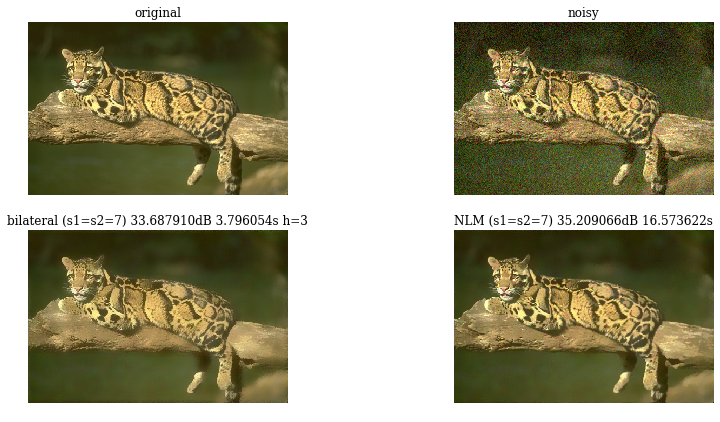

In [32]:
compare_bilateral_nlm(sig,s1=7,s2=7,p1=1,p2=1,h=3)

### Imagetools/assignment4.py

In [ ]:
""" Assignment 4

COMPLETE THIS FILE

Your name here: Justin Law A12346613

"""

from .assignment3 import *

def bilateral_naive(y, sig, s1=2, s2=2, h=1):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = max(alpha - 2 * h * variance,0)
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c)
        return math.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    for i in range(s1, n1-s1):
        for j in range(s2, n2-s2):
            tempx = tempz = 0
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = ((y[i + k, j + l] - y[i, j])**2).mean()
                    # complete
                    tempz += phi(dist2)
                    tempx += phi(dist2) * y[i + k, j + l]
            x[i,j] = tempx
            Z[i,j] = tempz
                    
    Z[Z == 0] = 1
    x = x / Z
    
    return x

def bilateral(y, sig, s1=10, s2=10, h=1,boundary='periodical'):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = alpha
        num[(alpha - 2 * h * variance) < 0] = 0
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c)
        return np.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))
    
    for k in range(-s1, s1 + 1):
        for l in range(-s2, s2 + 1):
            shifted_y = shift(y, -k, -l, boundary)
            dist2 = np.square(shifted_y - y)
            if y.ndim==3:
                dist2 = dist2.mean(axis=y.ndim-1)
                x += np.repeat(phi(dist2)[:, :, np.newaxis], 3, axis=2) * shifted_y
                Z += phi(dist2)[:, :, np.newaxis]
            else:
                x += phi(dist2) * shifted_y
                Z += phi(dist2)
                    
    Z[Z == 0] = 1
    x = x / Z
    
    return x

def nlmeans_naive(y, sig, s1=2, s2=2, p1=1, p2=1, h=1):
    import math
    
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    p = (2*p1 + 1)*(2*p2+1)

    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = max(alpha - 2 * h * variance,0)
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c*p)
        return math.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros((n1, n2, *[1] * (y.ndim - 2)))

    for i in range(s1, n1-s1-p1):
        for j in range(s2, n2-s2-p2):
            tempx = tempz = 0
            for k in range(-s1, s1 + 1):
                for l in range(-s2, s2 + 1):
                    dist2 = 0
                    for u in range(-p1, p1 + 1):
                        for v in range(-p2, p2 + 1):
                            # complete
                            dist2 += ((y[i + k + u, j + l + v] - y[i + u, j + v])**2).mean()
                                
                    tempx += phi(dist2/(c*p)) * y[i + k, j + l]
                    tempz += phi(dist2/(c*p))
            x[i,j] = tempx
            Z[i,j] = tempz
            
    Z[Z == 0] = 1
    x = x / Z
    
    return x

def nlmeans(y, sig, s1=7, s2=7, p1=None, p2=None, h=1, boundary='periodical'):
    p1 = (1 if y.ndim == 3 else 2) if p1 is None else p1
    p2 = (1 if y.ndim == 3 else 2) if p2 is None else p2
    n1, n2 = y.shape[:2]
    c = y.shape[2] if y.ndim == 3 else 1
    p = (2*p1 + 1) * (2*p2+1)
    
    # define kernel function
    def phi(alpha):        
        variance = sig**2
        num = np.maximum(alpha - 2 * h * variance,0)
        denom = 2*math.sqrt(2)*h* variance / math.sqrt(c*p)
        return np.exp(-num/denom)
    
    x = np.zeros(y.shape)
    Z = np.zeros(y.shape)
    
    nu = kernel('box',tau=max(p1,p2))
    
    for k in range(-s1, s1 + 1):
        for l in range(-s2, s2 + 1):
            shifted_y = shift(y, -k, -l, boundary)   
            dist2 = convolve(np.square(shifted_y-y),nu,boundary)
            
            if y.ndim==3:
                dist2 = dist2.mean(axis=y.ndim-1)
                x += np.repeat(phi(dist2)[:, :, np.newaxis], 3, axis=2) * shifted_y
                Z += phi(dist2)[:, :, np.newaxis]
            else:
                x += phi(dist2) * shifted_y
                Z += phi(dist2)

    Z[Z == 0] = 1
    x = x / Z

    return x